# THIS NOTEBOOK SOURCE: 
https://github.com/LibraryOfCongress/newspaper-navigator/blob/master/notebooks/train_model.ipynb

_______________

# This notebook trains a visual content recognition model on *Beyond Words* bounding box annotations (plus additional headline + advertisement annotations). 

*Benjamin Charles Germain Lee*
(LOC Innovator-in-Residence)

This notebook finetunes a pre-trained object detection model (Faster-RCNN R50-FPN) to predict bounding boxes around photographs, illustrations, maps, comics, editorial cartoons, headlines, and annotations in historical newspaper images.  The notebook is described in more detail in the newspaper-navigator repo.

This notebook makes the following assumptions:

- The newspaper-navigator repo has been cloned, so the local file structure is intact.
- Detectron2 has been installed.  For Amazon EC2 instances with a Deep Learning Ubuntu AMI, the bash script for installing detectron2 (install-detectron2.sh) can be run to handle the installation (see the repo for more info).

This notebook is based on the following notebook:

- https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5


# First, we handle imports and data formatting.

This cell imports libraries and constructs a COCO instance using the training and validation JSON files; essentially, this enables the model to handle the data loading using the COCO standard:

In [3]:
# to display images inline
%matplotlib inline

# import some common libraries
import cv2
import random
import glob
import os
import shutil
import json
import math
import numpy as np
import matplotlib.pyplot as plt

# import detectron2, etc.
import detectron2
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.evaluation import COCOEvaluator
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

In [4]:
# cd into the beyond words dataset
os.chdir("/Users/alexdrozdz/Desktop/Studia/00. Seminarium magisterskie/newspaper-navigator-master/beyond_words_data")

# we now register the dataset
register_coco_instances("beyond_words_train", {}, "train_80_percent.json", "images")
register_coco_instances("beyond_words_val", {}, "val_20_percent.json", "images")
register_coco_instances("beyond_words_combined", {}, "trainval.json", "images")

# Next, we visualize some examples.

This cell visualizes some examples from the training set:

WARNING [10/09 14:00:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/09 14:00:20 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
images/1978.jpg
images/2164.jpg
images/199.jpg
images/1324.jpg
images/2612.jpg


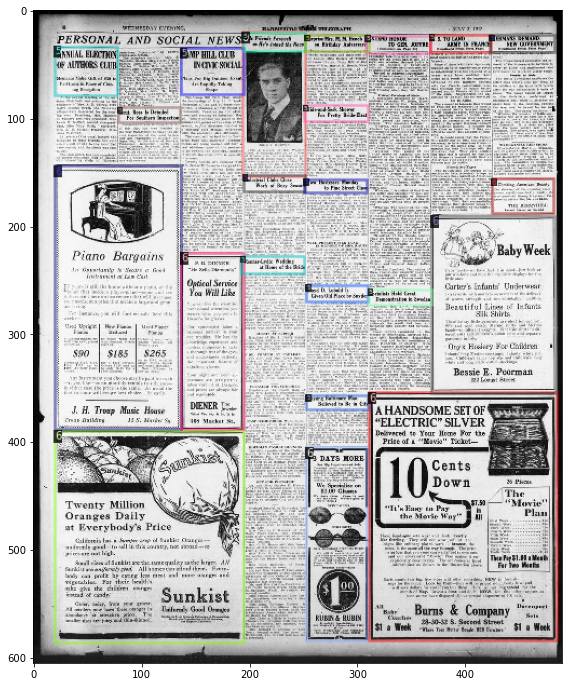

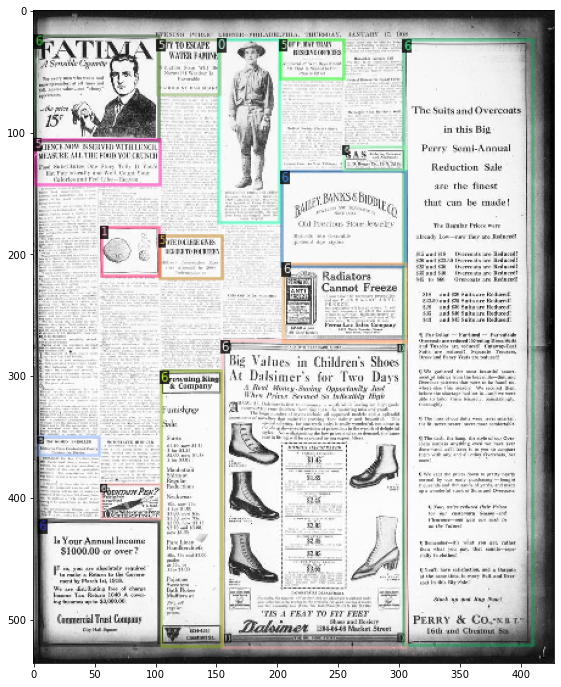

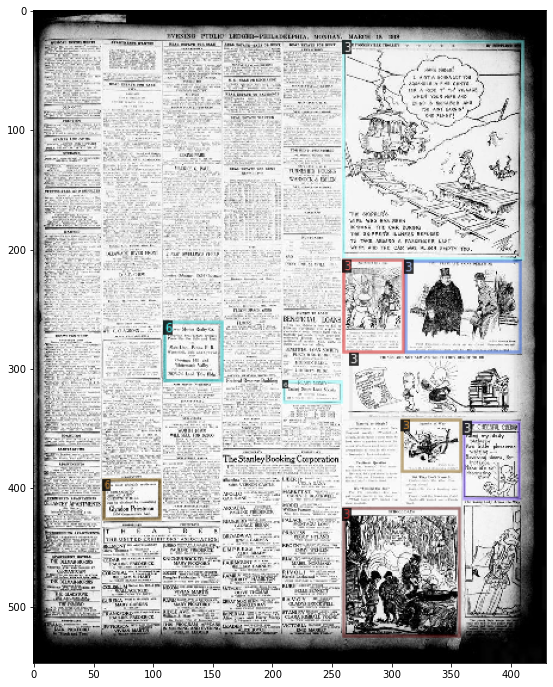

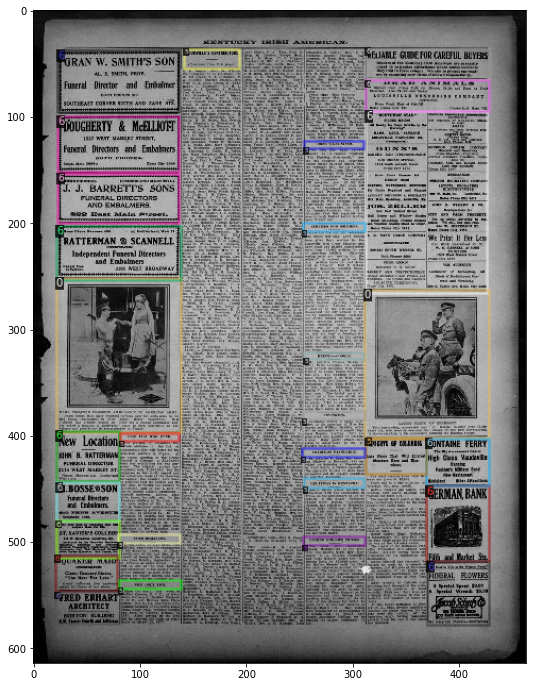

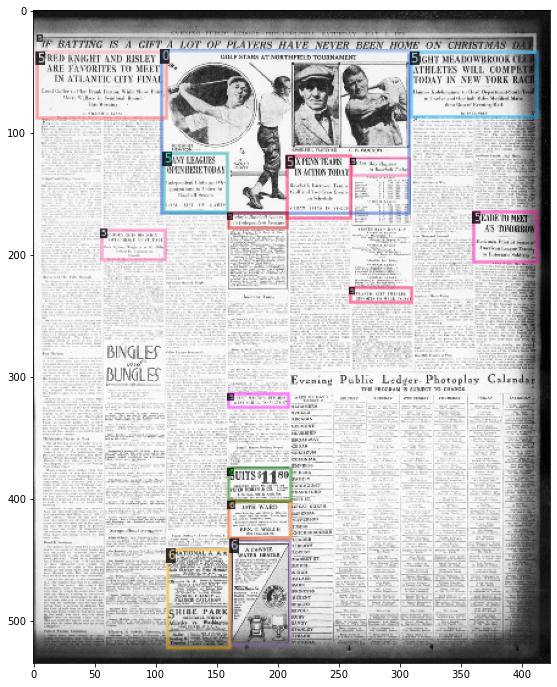

In [6]:
# sets random seed for reproducibility
random.seed(0)

dataset_dicts = DatasetCatalog.get("beyond_words_train")
my_metadata = MetadataCatalog.get("beyond_words_val")

n_examples_to_display = 5
for d in random.sample(dataset_dicts, n_examples_to_display):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_metadata, scale=0.5)
    v = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(15,12))
    plt.imshow(v.get_image()[:, :, ::-1])

# Next, we finetune the Faster-RCNN implementation from Detectron2's Model Zoo.

We can pick our choice of pre-trained model here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines.

The 7 classes of visual content are:

- Photograph
- Illustration
- Map
- Comics/Cartoon
- Editorial Cartoon
- Headline
- Advertisement

Below, we finetune "Faster_rcnn_R_50_FPN_3x" and evaluate mean average precision on the held-out data (80%-20% train-val split); for this demo we run for 10 epochs - feel free to run for more epochs and watch the performance on the validation set improve!

Note that there are lines of code below (currently commented out) for saving intermediate model weights and predictions on the validation set to an S3 bucket for later analysis.


In [10]:
# sets batch size
batch_size = 16
# sets epoch size accordingly (to convert iterations to epochs)
epoch = math.ceil(2748/float(batch_size))
# sets total number of epochs to train for
epoch_num = 10

cfg = get_cfg()
# loads in correct pre-trained model parameters
cfg.merge_from_file("../../../../../../Users/alexdrozdz/opt/miniconda3/envs/my_anaconda_dont/lib/python3.8/site-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
# loads pre-trained model weights (from Model Zoo)
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
# loads in training/val data using the registered COCO instance
cfg.DATASETS.TRAIN = ("beyond_words_train",)
cfg.DATASETS.TEST = ("beyond_words_val",)
# sets number of object classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7

# makes output directory for weights, etc.
os.makedirs("../model_weights/", exist_ok=True)

# sets output directory for model weights, checkpoints, etc.
cfg.OUTPUT_DIR = '../model_weights/'

# some hyperparameters
cfg.SOLVER.BASE_LR = 0.00025
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.SOLVER.MAX_ITER = epoch
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.MODEL.DEVICE = 'cpu'

print("EPOCH 1")

# trains for one epoch
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)  #change here if resuming
trainer.train()

######## FOR SAVING MODEL WEIGHTS AFTER EACH EPOCH TO AN S3 BUCKET #########
# with open("../model_weights/model_final.pth", "rb") as f:
#     s3.upload_fileobj(f, "BUCKET-NAME-HERE", "new_val_model_weights/model_epoch_1.pth")
############################################################################

# evaluates on validation data after one epoch
# metrics are printed out to console
trainer.test(trainer.cfg, trainer.model, COCOEvaluator("beyond_words_val", trainer.cfg, False, trainer.cfg.OUTPUT_DIR))

######## FOR SAVING PREDICTIONS ON VALIDATION SET AFTER EACH EPOCH TO AN S3 BUCKET ########
# with open("../model_weights/coco_instances_results.json", "rb") as f:
#     s3.upload_fileobj(f, "BUCKET-NAME-HERE", "new_val_model_weights/coco_results_epoch_1.json")
###########################################################################################

# trains then evaluates on validation data iteratively for desired number of epochs
for i in range(0, epoch_num-1):
    
    print("EPOCH " + str(i+2))

    # trains again
    cfg.SOLVER.MAX_ITER = epoch*(i+2)
    trainer = DefaultTrainer(cfg) 
    trainer.resume_or_load(resume=True)
    trainer.train()
    
    ######## FOR SAVING MODEL WEIGHTS AFTER EACH EPOCH TO AN S3 BUCKET #########
#     with open("../model_weights/model_final.pth", "rb") as f:
#         s3.upload_fileobj(f, "BUCKET-NAME-HERE", "new_val_model_weights/model_eopch_" + str(i+2) + ".pth")
    ############################################################################   
    
    trainer.test(trainer.cfg, trainer.model, COCOEvaluator("beyond_words_val", trainer.cfg, False, trainer.cfg.OUTPUT_DIR))

    ######## FOR SAVING PREDICTIONS ON VALIDATION SET AFTER EACH EPOCH TO AN S3 BUCKET ########
#     with open("../model_weights/coco_instances_results.json", "rb") as f:
#         s3.upload_fileobj(f, "BUCKET-NAME-HERE", "new_val_model_weights/coco_results_epoch_" + str(i+2) + ".json")
    ###########################################################################################

EPOCH 1
[10/09 14:04:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
  

WARNING [10/09 14:04:10 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/09 14:04:10 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[10/09 14:04:11 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[10/09 14:04:11 d2.data.build]: Distribution of instances among all 7 categories:
|   category    | #instances   |   category    | #instances   |  category  | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:----------:|:-------------|
|  Photograph   | 3375         | Illustration  | 842          |    Map     | 181          |
| Comics/Cart.. | 939          | Editorial C.. | 239          |  Headline  | 22179        |
| Advertisement | 10723        |               |              |            |              |
|     total     | 38478        |               |              |            |              |
[10/09 14:04:11 d2.data.dataset_

model_final_280758.pkl: 167MB [00:17, 9.30MB/s]                              
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (28, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (28,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.bo

[10/09 14:04:44 d2.engine.train_loop]: Starting training from iteration 0


/Users/alexdrozdz/opt/miniconda3/envs/my_anaconda_dont/lib/python3.8/site-packages/detectron2/modeling/roi_heads/fast_rcnn.py:103: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /Users/distiller/project/conda/conda-bld/pytorch_1603740477510/work/torch/csrc/utils/python_arg_parser.cpp:882.)
  num_fg = fg_inds.nonzero().numel()


[10/09 14:48:30 d2.utils.events]:  eta: 5:26:32  iter: 19  total_loss: 4.301  loss_cls: 1.997  loss_box_reg: 0.6572  loss_rpn_cls: 1.505  loss_rpn_loc: 0.2018  time: 130.3785  data_time: 0.2975  lr: 2.7839e-05  
[10/09 15:32:32 d2.utils.events]:  eta: 4:48:31  iter: 39  total_loss: 2.723  loss_cls: 1.626  loss_box_reg: 0.7843  loss_rpn_cls: 0.2007  loss_rpn_loc: 0.1366  time: 131.2886  data_time: 0.1603  lr: 5.6879e-05  
[10/09 16:15:53 d2.utils.events]:  eta: 4:05:23  iter: 59  total_loss: 2.12  loss_cls: 1  loss_box_reg: 0.8048  loss_rpn_cls: 0.1293  loss_rpn_loc: 0.1333  time: 130.8699  data_time: 0.1488  lr: 8.592e-05  
[10/09 17:00:57 d2.utils.events]:  eta: 3:21:54  iter: 79  total_loss: 1.929  loss_cls: 0.8811  loss_box_reg: 0.7946  loss_rpn_cls: 0.1096  loss_rpn_loc: 0.145  time: 131.9808  data_time: 0.1535  lr: 0.00011496  
[10/09 17:44:51 d2.utils.events]:  eta: 2:37:38  iter: 99  total_loss: 1.813  loss_cls: 0.8014  loss_box_reg: 0.7653  loss_rpn_cls: 0.1085  loss_rpn_loc: 0

[10/09 20:28:37 d2.evaluation.evaluator]: Inference done 21/712. Dataloading: 0.0005 s/iter. Inference: 6.0938 s/iter. Eval: 0.0003 s/iter. Total: 6.0956 s/iter. ETA=1:10:12
[10/09 20:28:43 d2.evaluation.evaluator]: Inference done 22/712. Dataloading: 0.0005 s/iter. Inference: 6.0739 s/iter. Eval: 0.0003 s/iter. Total: 6.0756 s/iter. ETA=1:09:52
[10/09 20:28:49 d2.evaluation.evaluator]: Inference done 23/712. Dataloading: 0.0005 s/iter. Inference: 6.0709 s/iter. Eval: 0.0003 s/iter. Total: 6.0727 s/iter. ETA=1:09:44
[10/09 20:28:56 d2.evaluation.evaluator]: Inference done 24/712. Dataloading: 0.0005 s/iter. Inference: 6.0970 s/iter. Eval: 0.0003 s/iter. Total: 6.0988 s/iter. ETA=1:09:55
[10/09 20:29:02 d2.evaluation.evaluator]: Inference done 25/712. Dataloading: 0.0005 s/iter. Inference: 6.1165 s/iter. Eval: 0.0003 s/iter. Total: 6.1182 s/iter. ETA=1:10:03
[10/09 20:29:09 d2.evaluation.evaluator]: Inference done 26/712. Dataloading: 0.0005 s/iter. Inference: 6.1204 s/iter. Eval: 0.000

[10/09 20:33:17 d2.evaluation.evaluator]: Inference done 66/712. Dataloading: 0.0006 s/iter. Inference: 6.1822 s/iter. Eval: 0.0003 s/iter. Total: 6.1840 s/iter. ETA=1:06:34
[10/09 20:33:23 d2.evaluation.evaluator]: Inference done 67/712. Dataloading: 0.0006 s/iter. Inference: 6.1817 s/iter. Eval: 0.0003 s/iter. Total: 6.1835 s/iter. ETA=1:06:28
[10/09 20:33:30 d2.evaluation.evaluator]: Inference done 68/712. Dataloading: 0.0006 s/iter. Inference: 6.1871 s/iter. Eval: 0.0003 s/iter. Total: 6.1888 s/iter. ETA=1:06:25
[10/09 20:33:36 d2.evaluation.evaluator]: Inference done 69/712. Dataloading: 0.0005 s/iter. Inference: 6.1850 s/iter. Eval: 0.0003 s/iter. Total: 6.1868 s/iter. ETA=1:06:18
[10/09 20:33:42 d2.evaluation.evaluator]: Inference done 70/712. Dataloading: 0.0005 s/iter. Inference: 6.1860 s/iter. Eval: 0.0003 s/iter. Total: 6.1878 s/iter. ETA=1:06:12
[10/09 20:33:48 d2.evaluation.evaluator]: Inference done 71/712. Dataloading: 0.0005 s/iter. Inference: 6.1825 s/iter. Eval: 0.000

[10/09 20:37:55 d2.evaluation.evaluator]: Inference done 111/712. Dataloading: 0.0006 s/iter. Inference: 6.1766 s/iter. Eval: 0.0003 s/iter. Total: 6.1783 s/iter. ETA=1:01:53
[10/09 20:38:01 d2.evaluation.evaluator]: Inference done 112/712. Dataloading: 0.0006 s/iter. Inference: 6.1748 s/iter. Eval: 0.0003 s/iter. Total: 6.1766 s/iter. ETA=1:01:45
[10/09 20:38:08 d2.evaluation.evaluator]: Inference done 113/712. Dataloading: 0.0006 s/iter. Inference: 6.1809 s/iter. Eval: 0.0003 s/iter. Total: 6.1827 s/iter. ETA=1:01:43
[10/09 20:38:14 d2.evaluation.evaluator]: Inference done 114/712. Dataloading: 0.0006 s/iter. Inference: 6.1801 s/iter. Eval: 0.0003 s/iter. Total: 6.1819 s/iter. ETA=1:01:36
[10/09 20:38:20 d2.evaluation.evaluator]: Inference done 115/712. Dataloading: 0.0006 s/iter. Inference: 6.1813 s/iter. Eval: 0.0003 s/iter. Total: 6.1831 s/iter. ETA=1:01:31
[10/09 20:38:27 d2.evaluation.evaluator]: Inference done 116/712. Dataloading: 0.0006 s/iter. Inference: 6.1839 s/iter. Eval:

[10/09 20:42:36 d2.evaluation.evaluator]: Inference done 156/712. Dataloading: 0.0006 s/iter. Inference: 6.1957 s/iter. Eval: 0.0003 s/iter. Total: 6.1975 s/iter. ETA=0:57:25
[10/09 20:42:42 d2.evaluation.evaluator]: Inference done 157/712. Dataloading: 0.0006 s/iter. Inference: 6.1993 s/iter. Eval: 0.0003 s/iter. Total: 6.2011 s/iter. ETA=0:57:21
[10/09 20:42:48 d2.evaluation.evaluator]: Inference done 158/712. Dataloading: 0.0006 s/iter. Inference: 6.1976 s/iter. Eval: 0.0003 s/iter. Total: 6.1994 s/iter. ETA=0:57:14
[10/09 20:42:54 d2.evaluation.evaluator]: Inference done 159/712. Dataloading: 0.0006 s/iter. Inference: 6.1965 s/iter. Eval: 0.0003 s/iter. Total: 6.1983 s/iter. ETA=0:57:07
[10/09 20:43:00 d2.evaluation.evaluator]: Inference done 160/712. Dataloading: 0.0006 s/iter. Inference: 6.1952 s/iter. Eval: 0.0003 s/iter. Total: 6.1970 s/iter. ETA=0:57:00
[10/09 20:43:06 d2.evaluation.evaluator]: Inference done 161/712. Dataloading: 0.0006 s/iter. Inference: 6.1905 s/iter. Eval:

[10/09 20:47:11 d2.evaluation.evaluator]: Inference done 201/712. Dataloading: 0.0006 s/iter. Inference: 6.1758 s/iter. Eval: 0.0003 s/iter. Total: 6.1776 s/iter. ETA=0:52:36
[10/09 20:47:17 d2.evaluation.evaluator]: Inference done 202/712. Dataloading: 0.0006 s/iter. Inference: 6.1761 s/iter. Eval: 0.0003 s/iter. Total: 6.1779 s/iter. ETA=0:52:30
[10/09 20:47:23 d2.evaluation.evaluator]: Inference done 203/712. Dataloading: 0.0006 s/iter. Inference: 6.1761 s/iter. Eval: 0.0003 s/iter. Total: 6.1778 s/iter. ETA=0:52:24
[10/09 20:47:29 d2.evaluation.evaluator]: Inference done 204/712. Dataloading: 0.0006 s/iter. Inference: 6.1748 s/iter. Eval: 0.0003 s/iter. Total: 6.1766 s/iter. ETA=0:52:17
[10/09 20:47:35 d2.evaluation.evaluator]: Inference done 205/712. Dataloading: 0.0006 s/iter. Inference: 6.1717 s/iter. Eval: 0.0003 s/iter. Total: 6.1734 s/iter. ETA=0:52:09
[10/09 20:47:41 d2.evaluation.evaluator]: Inference done 206/712. Dataloading: 0.0006 s/iter. Inference: 6.1706 s/iter. Eval:

[10/09 20:51:44 d2.evaluation.evaluator]: Inference done 246/712. Dataloading: 0.0006 s/iter. Inference: 6.1547 s/iter. Eval: 0.0003 s/iter. Total: 6.1564 s/iter. ETA=0:47:48
[10/09 20:51:50 d2.evaluation.evaluator]: Inference done 247/712. Dataloading: 0.0006 s/iter. Inference: 6.1566 s/iter. Eval: 0.0003 s/iter. Total: 6.1584 s/iter. ETA=0:47:43
[10/09 20:51:56 d2.evaluation.evaluator]: Inference done 248/712. Dataloading: 0.0006 s/iter. Inference: 6.1560 s/iter. Eval: 0.0003 s/iter. Total: 6.1578 s/iter. ETA=0:47:37
[10/09 20:52:03 d2.evaluation.evaluator]: Inference done 249/712. Dataloading: 0.0006 s/iter. Inference: 6.1573 s/iter. Eval: 0.0003 s/iter. Total: 6.1591 s/iter. ETA=0:47:31
[10/09 20:52:09 d2.evaluation.evaluator]: Inference done 250/712. Dataloading: 0.0006 s/iter. Inference: 6.1566 s/iter. Eval: 0.0003 s/iter. Total: 6.1583 s/iter. ETA=0:47:25
[10/09 20:52:15 d2.evaluation.evaluator]: Inference done 251/712. Dataloading: 0.0006 s/iter. Inference: 6.1562 s/iter. Eval:

[10/09 20:56:20 d2.evaluation.evaluator]: Inference done 291/712. Dataloading: 0.0006 s/iter. Inference: 6.1519 s/iter. Eval: 0.0003 s/iter. Total: 6.1537 s/iter. ETA=0:43:10
[10/09 20:56:26 d2.evaluation.evaluator]: Inference done 292/712. Dataloading: 0.0006 s/iter. Inference: 6.1515 s/iter. Eval: 0.0003 s/iter. Total: 6.1532 s/iter. ETA=0:43:04
[10/09 20:56:32 d2.evaluation.evaluator]: Inference done 293/712. Dataloading: 0.0006 s/iter. Inference: 6.1511 s/iter. Eval: 0.0003 s/iter. Total: 6.1528 s/iter. ETA=0:42:58
[10/09 20:56:38 d2.evaluation.evaluator]: Inference done 294/712. Dataloading: 0.0006 s/iter. Inference: 6.1504 s/iter. Eval: 0.0003 s/iter. Total: 6.1521 s/iter. ETA=0:42:51
[10/09 20:56:44 d2.evaluation.evaluator]: Inference done 295/712. Dataloading: 0.0006 s/iter. Inference: 6.1499 s/iter. Eval: 0.0003 s/iter. Total: 6.1516 s/iter. ETA=0:42:45
[10/09 20:56:50 d2.evaluation.evaluator]: Inference done 296/712. Dataloading: 0.0006 s/iter. Inference: 6.1500 s/iter. Eval:

[10/09 21:00:54 d2.evaluation.evaluator]: Inference done 336/712. Dataloading: 0.0006 s/iter. Inference: 6.1442 s/iter. Eval: 0.0003 s/iter. Total: 6.1460 s/iter. ETA=0:38:30
[10/09 21:01:01 d2.evaluation.evaluator]: Inference done 337/712. Dataloading: 0.0006 s/iter. Inference: 6.1447 s/iter. Eval: 0.0003 s/iter. Total: 6.1464 s/iter. ETA=0:38:24
[10/09 21:01:07 d2.evaluation.evaluator]: Inference done 338/712. Dataloading: 0.0006 s/iter. Inference: 6.1446 s/iter. Eval: 0.0003 s/iter. Total: 6.1463 s/iter. ETA=0:38:18
[10/09 21:01:13 d2.evaluation.evaluator]: Inference done 339/712. Dataloading: 0.0006 s/iter. Inference: 6.1451 s/iter. Eval: 0.0003 s/iter. Total: 6.1468 s/iter. ETA=0:38:12
[10/09 21:01:19 d2.evaluation.evaluator]: Inference done 340/712. Dataloading: 0.0006 s/iter. Inference: 6.1447 s/iter. Eval: 0.0003 s/iter. Total: 6.1464 s/iter. ETA=0:38:06
[10/09 21:01:25 d2.evaluation.evaluator]: Inference done 341/712. Dataloading: 0.0006 s/iter. Inference: 6.1453 s/iter. Eval:

[10/09 21:05:32 d2.evaluation.evaluator]: Inference done 381/712. Dataloading: 0.0006 s/iter. Inference: 6.1471 s/iter. Eval: 0.0008 s/iter. Total: 6.1493 s/iter. ETA=0:33:55
[10/09 21:05:38 d2.evaluation.evaluator]: Inference done 382/712. Dataloading: 0.0006 s/iter. Inference: 6.1475 s/iter. Eval: 0.0008 s/iter. Total: 6.1497 s/iter. ETA=0:33:49
[10/09 21:05:44 d2.evaluation.evaluator]: Inference done 383/712. Dataloading: 0.0006 s/iter. Inference: 6.1470 s/iter. Eval: 0.0008 s/iter. Total: 6.1493 s/iter. ETA=0:33:43
[10/09 21:05:50 d2.evaluation.evaluator]: Inference done 384/712. Dataloading: 0.0006 s/iter. Inference: 6.1465 s/iter. Eval: 0.0008 s/iter. Total: 6.1487 s/iter. ETA=0:33:36
[10/09 21:05:56 d2.evaluation.evaluator]: Inference done 385/712. Dataloading: 0.0006 s/iter. Inference: 6.1455 s/iter. Eval: 0.0008 s/iter. Total: 6.1477 s/iter. ETA=0:33:30
[10/09 21:06:03 d2.evaluation.evaluator]: Inference done 386/712. Dataloading: 0.0006 s/iter. Inference: 6.1466 s/iter. Eval:

[10/09 21:10:07 d2.evaluation.evaluator]: Inference done 426/712. Dataloading: 0.0006 s/iter. Inference: 6.1422 s/iter. Eval: 0.0007 s/iter. Total: 6.1444 s/iter. ETA=0:29:17
[10/09 21:10:13 d2.evaluation.evaluator]: Inference done 427/712. Dataloading: 0.0006 s/iter. Inference: 6.1427 s/iter. Eval: 0.0007 s/iter. Total: 6.1449 s/iter. ETA=0:29:11
[10/09 21:10:19 d2.evaluation.evaluator]: Inference done 428/712. Dataloading: 0.0006 s/iter. Inference: 6.1428 s/iter. Eval: 0.0007 s/iter. Total: 6.1449 s/iter. ETA=0:29:05
[10/09 21:10:25 d2.evaluation.evaluator]: Inference done 429/712. Dataloading: 0.0006 s/iter. Inference: 6.1428 s/iter. Eval: 0.0007 s/iter. Total: 6.1450 s/iter. ETA=0:28:59
[10/09 21:10:32 d2.evaluation.evaluator]: Inference done 430/712. Dataloading: 0.0006 s/iter. Inference: 6.1438 s/iter. Eval: 0.0007 s/iter. Total: 6.1459 s/iter. ETA=0:28:53
[10/09 21:10:38 d2.evaluation.evaluator]: Inference done 431/712. Dataloading: 0.0006 s/iter. Inference: 6.1434 s/iter. Eval:

[10/09 21:14:46 d2.evaluation.evaluator]: Inference done 471/712. Dataloading: 0.0006 s/iter. Inference: 6.1482 s/iter. Eval: 0.0007 s/iter. Total: 6.1503 s/iter. ETA=0:24:42
[10/09 21:14:52 d2.evaluation.evaluator]: Inference done 472/712. Dataloading: 0.0006 s/iter. Inference: 6.1472 s/iter. Eval: 0.0007 s/iter. Total: 6.1493 s/iter. ETA=0:24:35
[10/09 21:14:58 d2.evaluation.evaluator]: Inference done 473/712. Dataloading: 0.0006 s/iter. Inference: 6.1471 s/iter. Eval: 0.0007 s/iter. Total: 6.1492 s/iter. ETA=0:24:29
[10/09 21:15:04 d2.evaluation.evaluator]: Inference done 474/712. Dataloading: 0.0006 s/iter. Inference: 6.1467 s/iter. Eval: 0.0007 s/iter. Total: 6.1488 s/iter. ETA=0:24:23
[10/09 21:15:10 d2.evaluation.evaluator]: Inference done 475/712. Dataloading: 0.0006 s/iter. Inference: 6.1467 s/iter. Eval: 0.0007 s/iter. Total: 6.1488 s/iter. ETA=0:24:17
[10/09 21:15:16 d2.evaluation.evaluator]: Inference done 476/712. Dataloading: 0.0006 s/iter. Inference: 6.1472 s/iter. Eval:

[10/09 21:19:22 d2.evaluation.evaluator]: Inference done 516/712. Dataloading: 0.0006 s/iter. Inference: 6.1472 s/iter. Eval: 0.0007 s/iter. Total: 6.1492 s/iter. ETA=0:20:05
[10/09 21:19:28 d2.evaluation.evaluator]: Inference done 517/712. Dataloading: 0.0006 s/iter. Inference: 6.1471 s/iter. Eval: 0.0007 s/iter. Total: 6.1491 s/iter. ETA=0:19:59
[10/09 21:19:34 d2.evaluation.evaluator]: Inference done 518/712. Dataloading: 0.0006 s/iter. Inference: 6.1469 s/iter. Eval: 0.0007 s/iter. Total: 6.1490 s/iter. ETA=0:19:52
[10/09 21:19:41 d2.evaluation.evaluator]: Inference done 519/712. Dataloading: 0.0006 s/iter. Inference: 6.1479 s/iter. Eval: 0.0007 s/iter. Total: 6.1500 s/iter. ETA=0:19:46
[10/09 21:19:47 d2.evaluation.evaluator]: Inference done 520/712. Dataloading: 0.0006 s/iter. Inference: 6.1476 s/iter. Eval: 0.0007 s/iter. Total: 6.1497 s/iter. ETA=0:19:40
[10/09 21:19:53 d2.evaluation.evaluator]: Inference done 521/712. Dataloading: 0.0006 s/iter. Inference: 6.1477 s/iter. Eval:

[10/09 21:24:00 d2.evaluation.evaluator]: Inference done 561/712. Dataloading: 0.0006 s/iter. Inference: 6.1497 s/iter. Eval: 0.0006 s/iter. Total: 6.1517 s/iter. ETA=0:15:28
[10/09 21:24:06 d2.evaluation.evaluator]: Inference done 562/712. Dataloading: 0.0006 s/iter. Inference: 6.1492 s/iter. Eval: 0.0006 s/iter. Total: 6.1512 s/iter. ETA=0:15:22
[10/09 21:24:13 d2.evaluation.evaluator]: Inference done 563/712. Dataloading: 0.0006 s/iter. Inference: 6.1500 s/iter. Eval: 0.0006 s/iter. Total: 6.1520 s/iter. ETA=0:15:16
[10/09 21:24:19 d2.evaluation.evaluator]: Inference done 564/712. Dataloading: 0.0006 s/iter. Inference: 6.1503 s/iter. Eval: 0.0006 s/iter. Total: 6.1523 s/iter. ETA=0:15:10
[10/09 21:24:25 d2.evaluation.evaluator]: Inference done 565/712. Dataloading: 0.0006 s/iter. Inference: 6.1500 s/iter. Eval: 0.0006 s/iter. Total: 6.1520 s/iter. ETA=0:15:04
[10/09 21:24:30 d2.evaluation.evaluator]: Inference done 566/712. Dataloading: 0.0006 s/iter. Inference: 6.1489 s/iter. Eval:

[10/09 21:28:36 d2.evaluation.evaluator]: Inference done 606/712. Dataloading: 0.0006 s/iter. Inference: 6.1481 s/iter. Eval: 0.0006 s/iter. Total: 6.1501 s/iter. ETA=0:10:51
[10/09 21:28:42 d2.evaluation.evaluator]: Inference done 607/712. Dataloading: 0.0006 s/iter. Inference: 6.1478 s/iter. Eval: 0.0006 s/iter. Total: 6.1498 s/iter. ETA=0:10:45
[10/09 21:28:49 d2.evaluation.evaluator]: Inference done 608/712. Dataloading: 0.0006 s/iter. Inference: 6.1493 s/iter. Eval: 0.0006 s/iter. Total: 6.1513 s/iter. ETA=0:10:39
[10/09 21:28:56 d2.evaluation.evaluator]: Inference done 609/712. Dataloading: 0.0006 s/iter. Inference: 6.1498 s/iter. Eval: 0.0006 s/iter. Total: 6.1518 s/iter. ETA=0:10:33
[10/09 21:29:02 d2.evaluation.evaluator]: Inference done 610/712. Dataloading: 0.0006 s/iter. Inference: 6.1508 s/iter. Eval: 0.0006 s/iter. Total: 6.1528 s/iter. ETA=0:10:27
[10/09 21:29:08 d2.evaluation.evaluator]: Inference done 611/712. Dataloading: 0.0006 s/iter. Inference: 6.1507 s/iter. Eval:

[10/09 21:33:15 d2.evaluation.evaluator]: Inference done 651/712. Dataloading: 0.0006 s/iter. Inference: 6.1511 s/iter. Eval: 0.0006 s/iter. Total: 6.1531 s/iter. ETA=0:06:15
[10/09 21:33:21 d2.evaluation.evaluator]: Inference done 652/712. Dataloading: 0.0006 s/iter. Inference: 6.1513 s/iter. Eval: 0.0006 s/iter. Total: 6.1533 s/iter. ETA=0:06:09
[10/09 21:33:27 d2.evaluation.evaluator]: Inference done 653/712. Dataloading: 0.0006 s/iter. Inference: 6.1516 s/iter. Eval: 0.0006 s/iter. Total: 6.1536 s/iter. ETA=0:06:03
[10/09 21:33:33 d2.evaluation.evaluator]: Inference done 654/712. Dataloading: 0.0006 s/iter. Inference: 6.1509 s/iter. Eval: 0.0006 s/iter. Total: 6.1529 s/iter. ETA=0:05:56
[10/09 21:33:39 d2.evaluation.evaluator]: Inference done 655/712. Dataloading: 0.0006 s/iter. Inference: 6.1513 s/iter. Eval: 0.0006 s/iter. Total: 6.1533 s/iter. ETA=0:05:50
[10/09 21:33:47 d2.evaluation.evaluator]: Inference done 656/712. Dataloading: 0.0006 s/iter. Inference: 6.1530 s/iter. Eval:

[10/09 21:37:54 d2.evaluation.evaluator]: Inference done 696/712. Dataloading: 0.0006 s/iter. Inference: 6.1544 s/iter. Eval: 0.0006 s/iter. Total: 6.1564 s/iter. ETA=0:01:38
[10/09 21:38:00 d2.evaluation.evaluator]: Inference done 697/712. Dataloading: 0.0006 s/iter. Inference: 6.1551 s/iter. Eval: 0.0006 s/iter. Total: 6.1571 s/iter. ETA=0:01:32
[10/09 21:38:07 d2.evaluation.evaluator]: Inference done 698/712. Dataloading: 0.0006 s/iter. Inference: 6.1556 s/iter. Eval: 0.0006 s/iter. Total: 6.1575 s/iter. ETA=0:01:26
[10/09 21:38:13 d2.evaluation.evaluator]: Inference done 699/712. Dataloading: 0.0006 s/iter. Inference: 6.1559 s/iter. Eval: 0.0006 s/iter. Total: 6.1579 s/iter. ETA=0:01:20
[10/09 21:38:19 d2.evaluation.evaluator]: Inference done 700/712. Dataloading: 0.0006 s/iter. Inference: 6.1556 s/iter. Eval: 0.0006 s/iter. Total: 6.1576 s/iter. ETA=0:01:13
[10/09 21:38:26 d2.evaluation.evaluator]: Inference done 701/712. Dataloading: 0.0006 s/iter. Inference: 6.1568 s/iter. Eval:

WARNING [10/09 21:39:49 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/09 21:39:49 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[10/09 21:39:49 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[10/09 21:39:49 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[10/09 21:39:49 d2.data.build]: Using training sampler TrainingSampler
[10/09 21:39:49 d2.data.common]: Serializing 2845 elements to byte tensors and concatenating them all ...
[10/09 21:39:49 d2.data.common]: Serialized dataset takes 1.65 MiB
WARNING [10/09 21:39:49 d2.solver.build]: SOLVER.STEPS contains values larger than SOLVER.MAX_ITER. These values will be ignored.
[10/09 21:39:59 d2.engine.hooks]: Loading scheduler from state_dict ...
[10/09 2

KeyboardInterrupt: 

# Next, we create a predictor for predicting on examples from the validaton set.

This cell generates a predictor for performing predictions on the validation examples:

In [4]:
# sets the testing confidence threshold
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("beyond_words_val", )

cfg.merge_from_file("../../../../../../Users/alexdrozdz/opt/miniconda3/envs/my_anaconda_dont/lib/python3.8/site-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7
cfg.MODEL.WEIGHTS = "../model_weights/model_final.pth"

predictor = DefaultPredictor(cfg)

# Lastly, we display the predictions.

This cell shows some sample predictions in the notebook itself:

WARNING [03/21 23:40:15 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 23:40:15 d2.data.datasets.coco]: Loaded 712 images in COCO format from val_20_percent.json


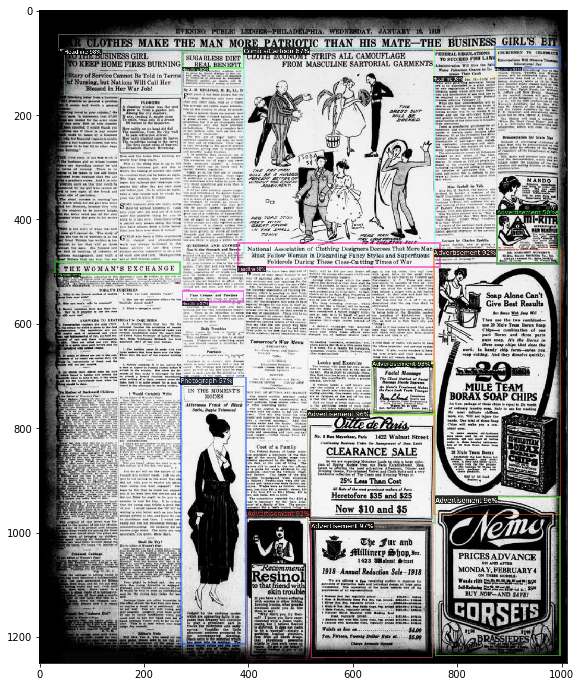

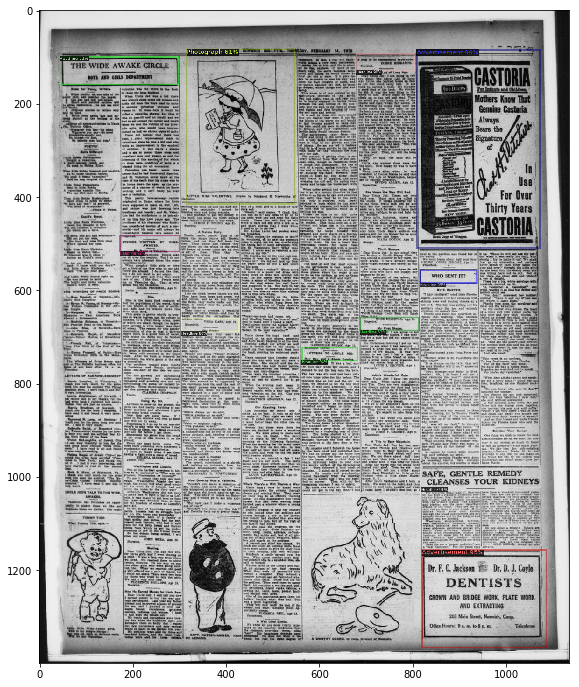

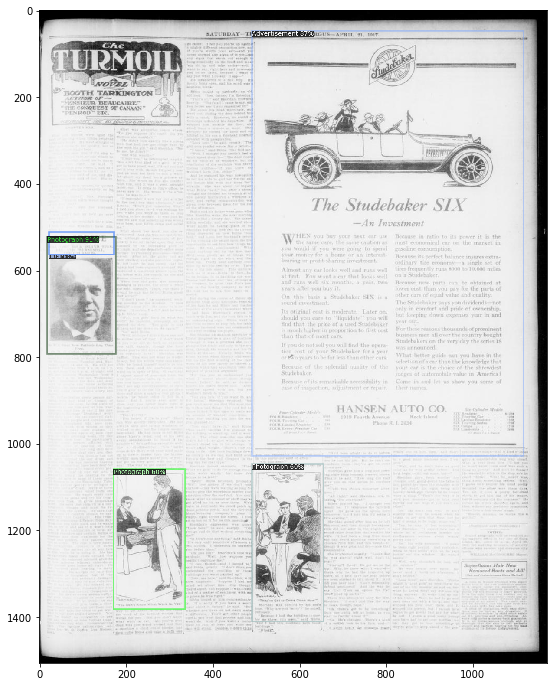

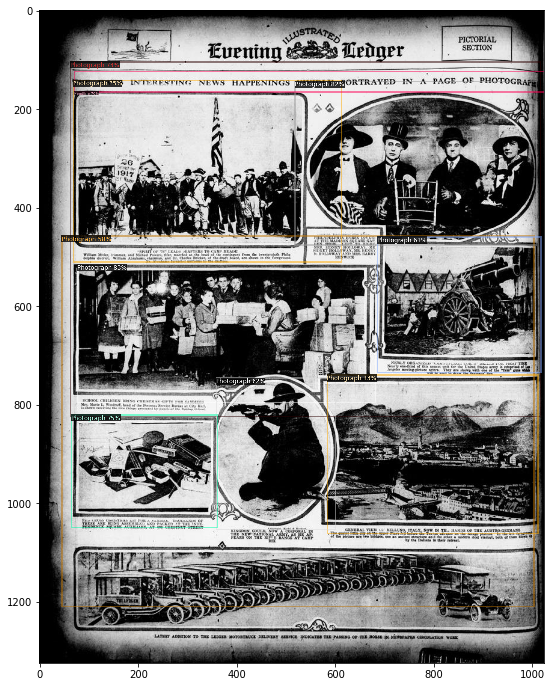

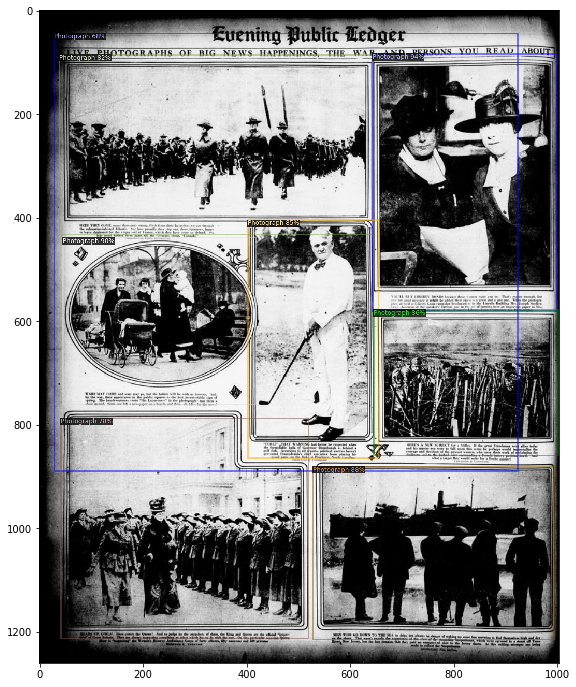

...

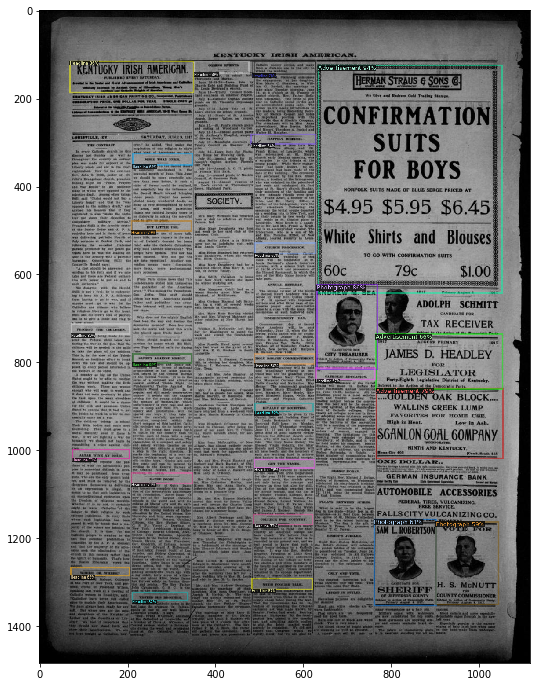

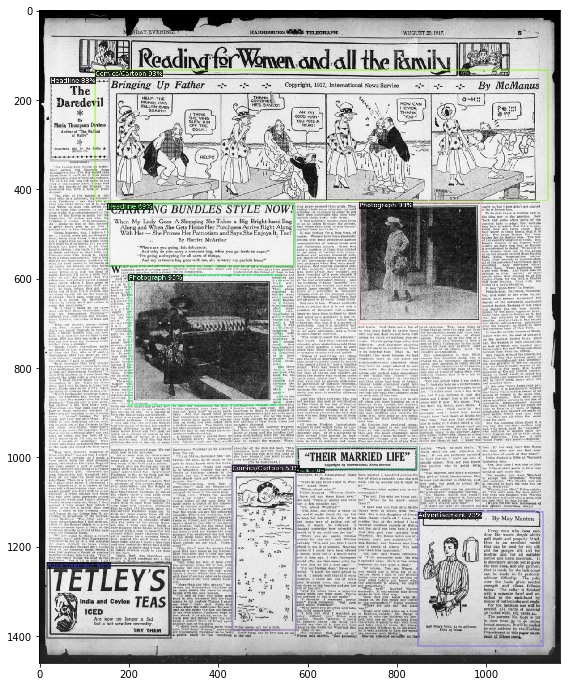

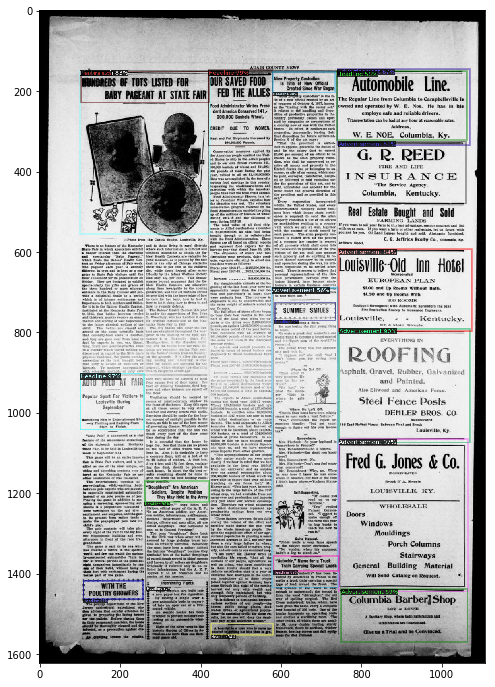

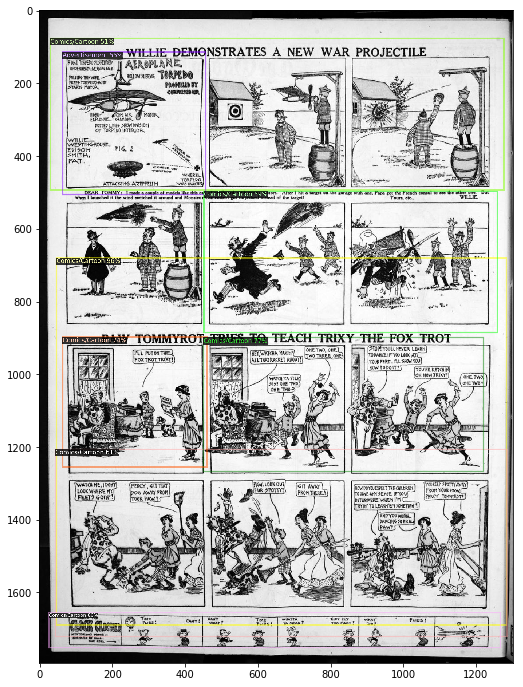

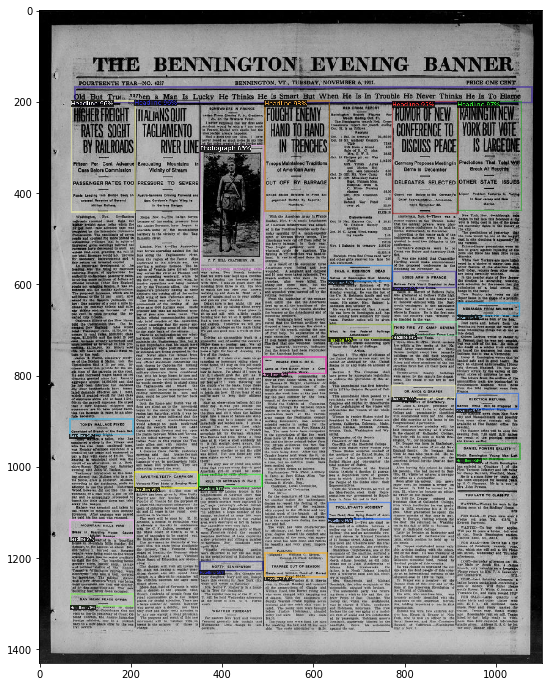

In [5]:
n_test_to_display = 20

for d in random.sample(DatasetCatalog.get("beyond_words_val"), n_test_to_display):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get("beyond_words_val"), 
                   scale=1.2   )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #v = v.draw_dataset_dict(d)
    plt.figure(figsize=(15,12))
    plt.imshow(v.get_image()[:, :, ::-1])
    
    # if we want to save the images:
    # cv2.imwrite(filepath_here, v.get_image()[:, :, ::-1])
